In [1]:
#import sys
#sys.path.append('../input/pytorch-image-models/pytorch-image-models-master')
import collections
import gc
import json
import os
import random
import time
import warnings
from pprint import pprint
warnings.simplefilter("ignore")

from mpl_toolkits.axes_grid1 import ImageGrid
from albumentations import *
from albumentations.pytorch import ToTensor
import cv2
from imblearn.under_sampling import RandomUnderSampler
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image, ImageFilter
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
#import tifffile as tiff
import timm
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Dataset, sampler
#from tqdm import tqdm_notebook as tqdm
from tqdm import tqdm

import s3fs
fs = s3fs.S3FileSystem()

%matplotlib inline
print(os.listdir())

['.git', '.gitignore', '.idea', '.ipynb_checkpoints', 'class_agnostic_counts.xlsx', 'class_agnostic_labeling.ipynb', 'crop_original_size.ipynb', 'efficientnet_v0.ipynb', 'main.py', 'mnist.ipynb', 'networks', 'not_tracking1.png', 'not_tracking2.png', 'not_tracking3.png', 'no_tracking.png', 'readme.md', 'requirements.txt', 'resnet50_orig_size', 'resnet50_rescale_v2', 'resnet50_rescale_v2 - old', 'resnet50_scaled', 'resnet50_tracking_v0(local).ipynb', 'resnet50_tracking_v1(local)_SORT.ipynb', 'resnet50_v0(local).ipynb', 'resnet50_v0(local)_old.ipynb', 'resnet50_v1(local)_orig_size.ipynb', 'resnet50_v1(local)_orig_size.py', 'resnet50_v1(local)_rescale.ipynb', 'show_plots.py', 'sub_resnet.csv', 'sub_resnet_800.csv', 'sub_tmp.csv', 'sub_trackingv1.csv', 'sub_trackingv2.csv', 'tracking.png', 'tracking1.png', 'tracking2.png', 'tracking3.png', 'zero_baseline.csv', 'zero_baseline_real.csv', '~$class_agnostic_counts.xlsx']


### setting

In [2]:
prefix = "D:\Data\wildcamdata"
DATASET = prefix
CROPED_DATA = os.path.join(DATASET, "256x256")

TRAIN_CROPED_DATA = os.path.join(CROPED_DATA, "croped_images_train")
TEST_CROPED_DATA = os.path.join(CROPED_DATA, "croped_images_test")

### create train dataframe

In [3]:
with open(os.path.join(DATASET, 'metadata\iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_train_annotation = pd.DataFrame(train_annotations["annotations"])

In [4]:
class_names = dict()
class_ids = []
for cat in train_annotations["categories"]:
    class_names[cat['id']] = cat['name']
    class_ids.append(cat['id'])
print(class_names)

{0: 'empty', 2: 'tayassu pecari', 3: 'dasyprocta punctata', 4: 'cuniculus paca', 6: 'puma concolor', 7: 'tapirus terrestris', 8: 'pecari tajacu', 9: 'mazama americana', 10: 'leopardus pardalis', 12: 'geotrygon montana', 13: 'nasua nasua', 14: 'dasypus novemcinctus', 15: 'eira barbara', 16: 'didelphis marsupialis', 20: 'procyon cancrivorus', 24: 'panthera onca', 25: 'myrmecophaga tridactyla', 26: 'tinamus major', 32: 'sylvilagus brasiliensis', 44: 'puma yagouaroundi', 50: 'leopardus wiedii', 62: 'mazama gouazoubira', 67: 'philander opossum', 70: 'capra aegagrus', 71: 'bos taurus', 72: 'ovis aries', 73: 'canis lupus', 74: 'lepus saxatilis', 77: 'turtur calcospilos', 78: 'papio anubis', 80: 'genetta genetta', 83: 'tragelaphus scriptus', 86: 'equus africanus', 89: 'herpestes sanguineus', 90: 'loxodonta africana', 91: 'cricetomys gambianus', 92: 'raphicerus campestris', 94: 'hyaena hyaena', 96: 'aepyceros melampus', 97: 'crocuta crocuta', 98: 'caracal caracal', 99: 'equus ferus', 100: 'pant

In [5]:
df_categories = pd.DataFrame(train_annotations["categories"])
cat_idxs = df_categories["id"]

def convert_cat_to_index(x):
    return np.where(cat_idxs==x)[0][0]

In [6]:
print(convert_cat_to_index(3))
class_names[class_ids[2]]

2


'dasyprocta punctata'

In [13]:
sub = pd.read_csv(os.path.join(DATASET, 'sample_submission.csv'))
col_Predicted = [col for col in sub.columns if "Predicted" in col]

## Load trained model

In [63]:
with open(os.path.join(DATASET, 'metadata\iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_train_information = pd.DataFrame(train_annotations["images"])[["id", "seq_id"]]
    
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]

In [133]:
train_annotations['images'][0]

{'seq_num_frames': 6,
 'location': 3,
 'datetime': '2013-06-05 05:44:19.000',
 'id': '8b02698a-21bc-11ea-a13a-137349068a90',
 'seq_id': '30048d32-7d42-11eb-8fb5-0242ac1c0002',
 'width': 1920,
 'height': 1080,
 'file_name': '8b02698a-21bc-11ea-a13a-137349068a90.jpg',
 'sub_location': 0,
 'seq_frame_num': 0}

In [135]:
im2seq = dict()
seq2im = collections.defaultdict(list)
for i, row in df_train_information.iterrows():
    im2seq[row.id] = row.seq_id
    seq2im[row.seq_id].append(row.id)
print("training images", len(im2seq.keys()))
print("training sequences", len(seq2im.keys()))

for i, row in df_test_info.iterrows():
    im2seq[row.id] = row.seq_id
    seq2im[row.seq_id].append(row.id)


training images 203314
training sequences 36547


In [136]:
print(len(seqs))

11057


In [65]:
train_seqs = df_train_information["seq_id"].unique().tolist()
df_train_information.head()

,id,seq_id
0,8b02698a-21bc-11ea-a13a-137349068a90,30048d32-7d42-11eb-8fb5-0242ac1c0002
1,8e5b81de-21bc-11ea-a13a-137349068a90,30048d32-7d42-11eb-8fb5-0242ac1c0002
2,8c6be0e4-21bc-11ea-a13a-137349068a90,30048d32-7d42-11eb-8fb5-0242ac1c0002
3,8fdf7998-21bc-11ea-a13a-137349068a90,30048d32-7d42-11eb-8fb5-0242ac1c0002
4,96093c50-21bc-11ea-a13a-137349068a90,30048d32-7d42-11eb-8fb5-0242ac1c0002


In [66]:
print(train_seqs[:10])

['30048d32-7d42-11eb-8fb5-0242ac1c0002', '929aea96-21bc-11ea-a13a-137349068a90', '932b6724-21bc-11ea-a13a-137349068a90', '302b4594-7d42-11eb-8fb5-0242ac1c0002', '5c8f4d8a-7ed0-11eb-b7d6-0242ac1c0002', '93ba6a96-21bc-11ea-a13a-137349068a90', '9650b9cc-21bc-11ea-a13a-137349068a90', '302f54e0-7d42-11eb-8fb5-0242ac1c0002', '9205274a-21bc-11ea-a13a-137349068a90', '90db6b86-21bc-11ea-a13a-137349068a90']


In [8]:
df_test_info.head()

,id,seq_id
0,8b31d3be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1,8cf202be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2,8a87e62e-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3,8e6994f4-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4,948b29e2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002


In [9]:
with open(os.path.join(DATASET, "metadata\\iwildcam2021_megadetector_results.json")) as f:
    megadetector = json.load(f)
print(megadetector["info"])
print(megadetector["detection_categories"])

{'format_version': '1.0', 'detector': 'megadetector_v3', 'detection_completion_time': '2020-01-10 08:49:05'}
{'2': 'person', '1': 'animal'}


In [14]:
boxes = collections.defaultdict(list)

for s in megadetector["images"]:
    for det in s["detections"]:
        if det["conf"] > .9:
            boxes[s["id"]].append(det['bbox'])
seqs = np.array(sub["Id"])

In [29]:
print(len(megadetector["images"]))
print(len(sub["Id"]))

263504
11057


In [15]:
print(seqs[:10])

['32ce8026-7ec9-11eb-b675-4f3cc0c82eb3'
 '945c6602-21bc-11ea-a13a-137349068a90'
 'a91c7e26-0cd3-11eb-bed1-0242ac1c0002'
 '9926239e-21bc-11ea-a13a-137349068a90'
 '9672184c-21bc-11ea-a13a-137349068a90'
 'a91764b8-0cd3-11eb-bed1-0242ac1c0002'
 'a91bb310-0cd3-11eb-bed1-0242ac1c0002'
 '947e14e6-21bc-11ea-a13a-137349068a90'
 'a921b56c-0cd3-11eb-bed1-0242ac1c0002'
 '3869411a-6fe2-11eb-844f-0242ac1c0002']


In [16]:
print(boxes["945336fe-21bc-11ea-a13a-137349068a90"])
for c in megadetector["images"]:
    if c["id"] == "945336fe-21bc-11ea-a13a-137349068a90":
        print(c)
        break

[]
{'detections': [{'category': '1', 'bbox': [0.5515, 0.4134, 0.036, 0.0598], 'conf': 0.754}, {'category': '1', 'bbox': [0.5549, 0.4148, 0.0308, 0.0376], 'conf': 0.477}, {'category': '1', 'bbox': [0.5449, 0.4125, 0.0436, 0.0855], 'conf': 0.349}], 'id': '945336fe-21bc-11ea-a13a-137349068a90', 'max_detection_conf': 0.754}


In [44]:
big = []
for i, s in enumerate(megadetector["images"]):
    num_boxes = 0
    for det in s["detections"]:
        num_boxes += len(det)
    if len(s["detections"]) > 0:
        #print(num_boxes / len(s["detections"]))
        if num_boxes / len(s["detections"]) >= 5:
            big.append(seq)
print(big)

[]


In [50]:
print(megadetector['images'][0])

{'detections': [{'category': '1', 'bbox': [0.6529, 0.5425, 0.3471, 0.4038], 'conf': 0.999}], 'id': '905a3c8c-21bc-11ea-a13a-137349068a90', 'max_detection_conf': 0.999}


In [120]:
big = []
for i, s in enumerate(megadetector["images"]):
    num_boxes = 0
    if len(s["detections"]) > 6 and len(s["detections"]) < 10:
        big.append(s["id"])
print(len(big))
print(big[0])

2830
905a4416-21bc-11ea-a13a-137349068a90


In [122]:
big_seqs = set()
for im in big:
    seq = im2seq[im]
    if len(seq) != None:
        big_seqs.add(seq)
print(big_seqs)

{'3028aaa0-7d42-11eb-8fb5-0242ac1c0002', '302d54ec-7d42-11eb-8fb5-0242ac1c0002', '2ffddca8-7d42-11eb-8fb5-0242ac1c0002', '30213842-7d42-11eb-8fb5-0242ac1c0002', '302808f2-7d42-11eb-8fb5-0242ac1c0002', '30245180-7d42-11eb-8fb5-0242ac1c0002', 'a9230ee4-0cd3-11eb-bed1-0242ac1c0002', '2fff04a2-7d42-11eb-8fb5-0242ac1c0002', 'a92467da-0cd3-11eb-bed1-0242ac1c0002', '3027f1a0-7d42-11eb-8fb5-0242ac1c0002', '9056487a-21bc-11ea-a13a-137349068a90', '301e4272-7d42-11eb-8fb5-0242ac1c0002', '3023e3a8-7d42-11eb-8fb5-0242ac1c0002', '301389f4-7d42-11eb-8fb5-0242ac1c0002', '300bb332-7d42-11eb-8fb5-0242ac1c0002', '302d9ef2-7d42-11eb-8fb5-0242ac1c0002', '3024df6a-7d42-11eb-8fb5-0242ac1c0002', '3018c91e-7d42-11eb-8fb5-0242ac1c0002', '302132ca-7d42-11eb-8fb5-0242ac1c0002', '3027e764-7d42-11eb-8fb5-0242ac1c0002', '300154b4-7d42-11eb-8fb5-0242ac1c0002', '30009d4e-7d42-11eb-8fb5-0242ac1c0002', '96681b8a-21bc-11ea-a13a-137349068a90', '3000314c-7d42-11eb-8fb5-0242ac1c0002', '3023f816-7d42-11eb-8fb5-0242ac1c0002',

In [ ]:
{'2ffddca8-7d42-11eb-8fb5-0242ac1c0002':'3027f1a0-7d42-11eb-8fb5-0242ac1c0002': 12, '2fff04a2-7d42-11eb-8fb5-0242ac1c0002': 8, '30274084-7d42-11eb-8fb5-0242ac1c0002': 18, '302808f2-7d42-11eb-8fb5-0242ac1c0002': 11}

Seq 2ffddca8-7d42-11eb-8fb5-0242ac1c0002


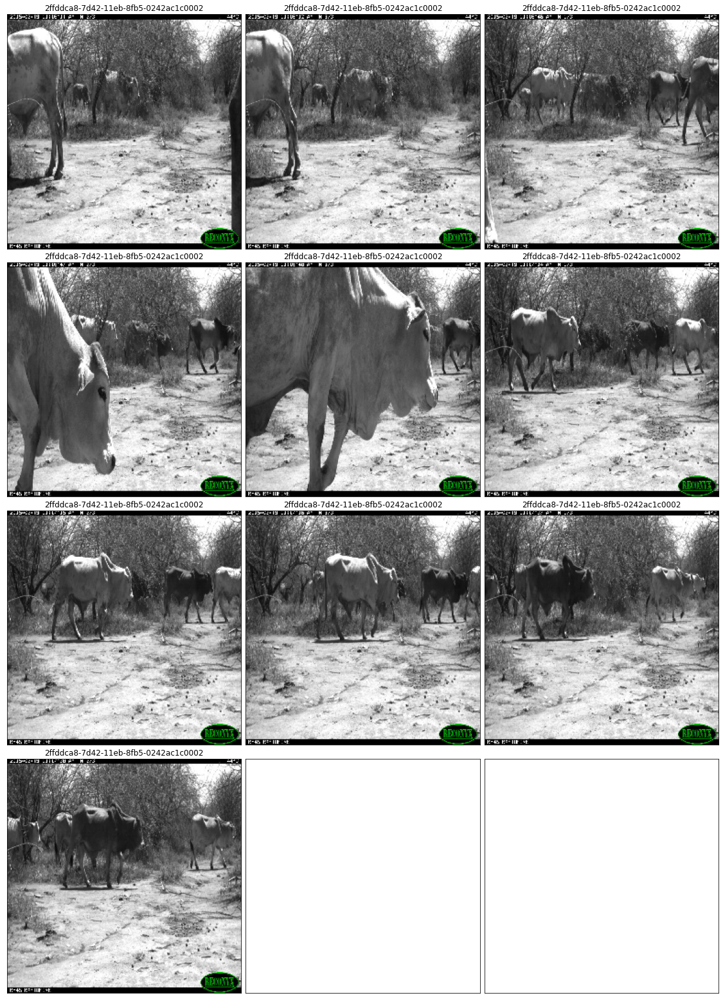

In [128]:
# Show Untracked
show = ['2ffddca8-7d42-11eb-8fb5-0242ac1c0002']#[, , , ]
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
    
for seq in show:
    im_ids.append(seq2im[seq])
    tot_imgs += len(im_ids[-1])
    
fig = plt.figure(figsize=(25., int(tot_imgs/ims_pre_row + 1) * 7.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    for k, im in enumerate(seq2im[seq]):
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        #ax.set_title(im)
        ax.set_title(seq)
        img_data = cv2.imread(os.path.join(DATASET, "test", im+".jpg"))
        if img_data is None:
            img_data = cv2.imread(os.path.join(DATASET, "train", im+".jpg"))
        cv2.imwrite(os.path.join(DATASET, "temp", str(k)+".jpg"), img_data)
        img = cv2.resize(cv2.cvtColor(img_data, cv2.COLOR_BGR2RGB), size)
        for j, box in enumerate(bboxes):
            #print(i, len(pred[im]), image_name)
            xy = (np.array(box[0:2]) * [len(img), len(img[0])]).astype(int)
            wh = (np.array(box[2:4]) * [len(img), len(img[0])]).astype(int)
            xy = (np.array(box[0:2]) * size).astype(int)
            wh = (np.array(box[2:4]) * size).astype(int)
            #cv2.rectangle(img, tuple(xy), tuple(xy + wh), (0, 255, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}")
        
    seq_im_ids = im_ids[i]
    

plt.savefig("lotsofdetections.png")
plt.show()

Seq 46
Seq 50
Seq 51
Seq 52
Seq 53


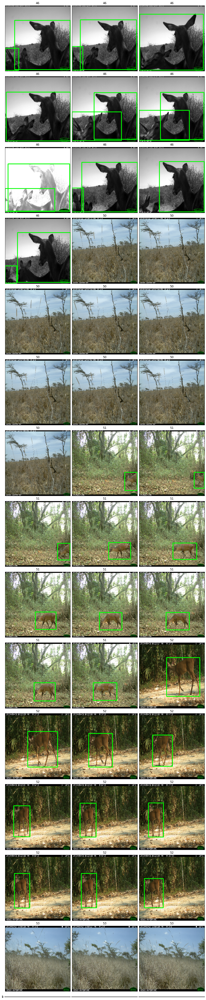

In [22]:
# Show Untracked
show = [46, 50, 51, 52, 53] #38
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
    
for seq_id in show:
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seqs[seq_id]]["id"]))
    tot_imgs += len(im_ids[-1])
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    seq_im_ids = im_ids[i]
    for im in seq_im_ids:
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        #ax.set_title(im)
        ax.set_title(seq)
        image_path = os.path.join(DATASET, "test", im+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for j, box in enumerate(bboxes):
            #print(i, len(pred[im]), image_name)
            xy = (np.array(box[0:2]) * [len(img), len(img[0])]).astype(int)
            wh = (np.array(box[2:4]) * [len(img), len(img[0])]).astype(int)
            xy = (np.array(box[0:2]) * size).astype(int)
            wh = (np.array(box[2:4]) * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), (0, 255, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}")
        
    seq_im_ids = im_ids[i]
    

#plt.savefig("not_tracking4.png")
plt.show()

Seq 37, count: 2
puma concolor
puma concolor
tinamus major
tinamus major


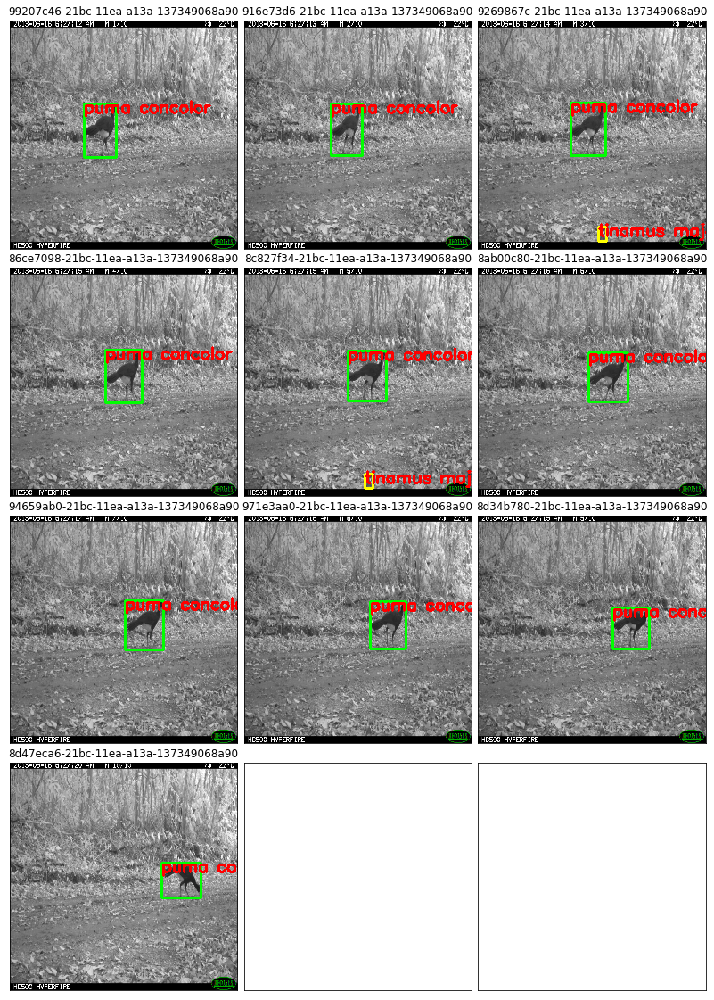

In [129]:
# Show Tracked
show = [37] # 17, 36-38
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
colors = [(0, 255, 0), (255, 255, 0), (0, 255, 255)]
    
for seq_id in show:
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seqs[seq_id]]["id"]))
    tot_imgs += len(im_ids[-1])
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    show_info = []
    for im in seq_im_ids:
        show_info.append([])
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            wh = np.array(box[2:4])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    show_info[-1].append([j, xy, wh, (xy - last_xy)])
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
                show_info[-1].append([len(unique_animals)-1, xy, wh, None])
    
    
    id_to_name = [(cum_pred_value.argsort()[-1]) for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals]
    for im, infos in zip(seq_im_ids, show_info):
        #print(df_train_annotation[df_train_annotation["image_id"] == im])
        #print(im)
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        ax.set_title(im)
        image_path = os.path.join(DATASET, "test", im+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for j, info in enumerate(infos):
            #print(i, len(pred[im]), image_name)
            box_label = id_to_name[info[0]]
            xy = (info[1] * size).astype(int)
            wh = (info[2] * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), colors[info[0]], 2)
            cv2.putText(img, class_names[class_ids[box_label]], tuple(xy+[0, 10]), cv2.FONT_HERSHEY_SIMPLEX, .6, (255, 0, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}, count: {len(unique_animals)}")
    for unique_animal in unique_animals:
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        
    seq_im_ids = im_ids[i]
    

#plt.savefig("tracking4.png")
plt.show()

# Create submit file

In [88]:
sub = pd.read_csv(os.path.join(DATASET, 'sample_submission.csv'))
# zero everything
for col in sub.columns[1:]:
    sub[col] = 0
    #print(col, np.sum(np.array(sub[col]).astype("float")))

In [89]:
with open(os.path.join(DATASET, 'metadata/iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_categories = pd.DataFrame.from_records(train_annotations["categories"])

In [90]:
im_ids = []
tot_imgs = 0
    
for seq_id in tqdm(seqs):
    #print(seq_id)
    #print(df_test_info[df_test_info["seq_id"] == seq_id]["id"])
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seq_id]["id"]))
    tot_imgs += len(im_ids[-1])

100%|███████████████████████████████████| 11057/11057 [01:02<00:00, 176.23it/s]


In [82]:
sub

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,32ce8026-7ec9-11eb-b675-4f3cc0c82eb3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,945c6602-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,a91c7e26-0cd3-11eb-bed1-0242ac1c0002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9926239e-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9672184c-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11052,96aedea8-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11053,98bf9b2e-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11054,3867ac88-6fe2-11eb-844f-0242ac1c0002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11055,940f8f6c-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [91]:
match_thresh = .08
dist_thresh = .2

counts = np.zeros((len(sub), 205))
#sub.set_index(['id'])
for i, seq in tqdm(enumerate(seqs)):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    for im in seq_im_ids:
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
    #row = sub[sub["Id"] == seq].index
    #print(row)
    for unique_animal in unique_animals:
        #print(unique_animal[-2])
        #print(np.array(unique_animal[-2]).argsort())
        #rint(sub.iloc[row].iloc[np.array(unique_animal[-2]).argsort()[-1]])
        counts[i, np.array(unique_animal[-2]).argsort()[-1]] += 1
        
columns = sub.columns
for column in range(1, 205):
    sub[columns[column]] = counts[:, column]

11057it [00:02, 4568.48it/s]


For each image, count the number of each animal species and store them in the corresponding column.

In [35]:
results = []

for key in pred.keys():
    c = collections.Counter(pred[key])
    
    res = []
    cnts = [ 0 for i in range(205)]
    for category, cnt in c.items():
        cnts[category] = cnt
    res += [key] + cnts[1:]
    results.append(res)

Convert to pandas dataframe.

In [36]:
sub_tmp = pd.DataFrame(results, columns=sub.columns)

In [37]:
sub_tmp.head()

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,915879a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,91588116-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9158a2f4-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9158aaa6-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9158f1a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
sub_tmp.to_csv("./sub_tmp.csv", index=False)

Add seq_id information to the counted results. iwildcam2021_test_information.json contains the mapping between the id of the image and the id of the sequence.

In [62]:
sub_tmp = pd.read_csv('./sub_tmp.csv')
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]
df_test_info.head(12)

,id,seq_id
0,8b31d3be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1,8cf202be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2,8a87e62e-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3,8e6994f4-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4,948b29e2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
5,8737aba8-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
6,918ca6a8-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
7,96d7ef64-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
8,90eac734-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
9,888ea6d2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002


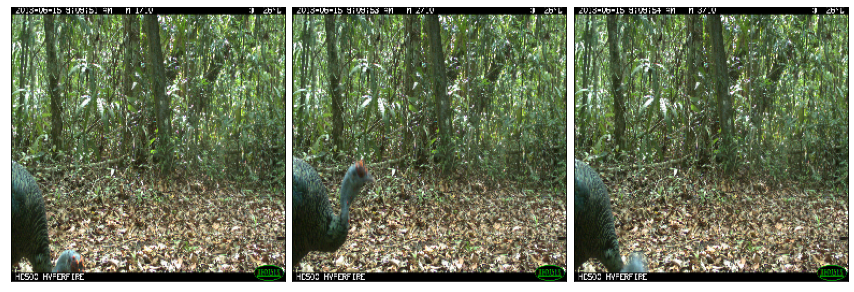

In [186]:
seqs = np.array(df_test_info["seq_id"].unique())
img_id = 12
imgs = np.array(df_test_info[df_test_info["seq_id"] == seqs[img_id]]["id"])
show = len(imgs)
fig = plt.figure(figsize=(15., (show/3) * 5.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(int(show/3), 3),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )
size = (256, 256)
for ax, image_path in zip(grid, imgs):
    # Iterating over the grid returns the Axes.
    image_path = os.path.join(DATASET, "test", image_path+".jpg")
    ax.get_yaxis().set_ticks([])
    ax.get_xaxis().set_ticks([])
    ax.imshow(cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size))

plt.show()

In [35]:
for i in df_test_info[:9]["id"]:
    print(i)
print(df_test_info[:11])

8b31d3be-21bc-11ea-a13a-137349068a90
8cf202be-21bc-11ea-a13a-137349068a90
8a87e62e-21bc-11ea-a13a-137349068a90
8e6994f4-21bc-11ea-a13a-137349068a90
948b29e2-21bc-11ea-a13a-137349068a90
8737aba8-21bc-11ea-a13a-137349068a90
918ca6a8-21bc-11ea-a13a-137349068a90
96d7ef64-21bc-11ea-a13a-137349068a90
90eac734-21bc-11ea-a13a-137349068a90
                                      id                                seq_id
0   8b31d3be-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1   8cf202be-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2   8a87e62e-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3   8e6994f4-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4   948b29e2-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
5   8737aba8-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
6   918ca6a8-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
7   96d7ef64-21bc-11ea-a13a-1373490

Take right join on the image id.

In [41]:
sub_tmp = sub_tmp.merge(df_test_info, left_on="Id", right_on="id", how="right")

In [63]:
sub_tmp.head(10)

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,915879a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,91588116-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9158a2f4-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9158aaa6-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9158f1a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,9159244a-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,91599f88-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,915a05ea-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,915a0cde-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,915a41b8-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Since there are multiple lines for the same sequence ID. We should aggregate them to single line. In this case, we will choose the image with the highest number of animals shown and submit the animal species and the number of animals shown in that image.

In [60]:
sum_counts = []
for i in tqdm(range(len(sub_tmp))):
    sum_counts.append(sum(sub_tmp.iloc[i][col_Predicted]))
print(sum_counts)

 47%|████████████████▉                   | 5187/11057 [00:06<00:07, 757.34it/s]


TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [44]:
sub_tmp["total"] =  sum_counts
sub_tmp = sub_tmp.sort_values('total', ascending=False)
sub_tmp = sub_tmp[~sub_tmp.duplicated(keep='first', subset='seq_id')].fillna("0")

In [45]:
sub_tmp

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571,id,seq_id,total
59868,91937e92-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91937e92-21bc-11ea-a13a-137349068a90,a917398e-0cd3-11eb-bed1-0242ac1c0002,6.0
14371,917d5b80-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,917d5b80-21bc-11ea-a13a-137349068a90,a925a870-0cd3-11eb-bed1-0242ac1c0002,4.0
20217,91764bb0-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91764bb0-21bc-11ea-a13a-137349068a90,a925bec8-0cd3-11eb-bed1-0242ac1c0002,4.0
32018,9174204c-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9174204c-21bc-11ea-a13a-137349068a90,a924d558-0cd3-11eb-bed1-0242ac1c0002,4.0
44759,91706fc4-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91706fc4-21bc-11ea-a13a-137349068a90,a9190016-0cd3-11eb-bed1-0242ac1c0002,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60115,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,8c3b0424-21bc-11ea-a13a-137349068a90,9500e290-21bc-11ea-a13a-137349068a90,0
60148,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,8d2b546a-21bc-11ea-a13a-137349068a90,386634a2-6fe2-11eb-844f-0242ac1c0002,0
60158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,902c630c-21bc-11ea-a13a-137349068a90,982a8f20-21bc-11ea-a13a-137349068a90,0
60167,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,867fbf02-21bc-11ea-a13a-137349068a90,92c82344-21bc-11ea-a13a-137349068a90,0


I'll match the result to the sample submission format. I was told that the order of the rows is not related to the score, but we will match it just in case.

In [46]:
# Since it was difficult to join the pandas series, I intentionally created an extra column.
sub = sub.reset_index()
sub = sub[["index", "Id"]].merge(sub_tmp, left_on="Id", right_on="seq_id")

In [47]:
sub = sub[["Id_x"] + col_Predicted].rename(columns={"Id_x": "Id"})

In [92]:
sub.to_csv("./sub_trackingv2.csv", index=False)
sub.head()

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,32ce8026-7ec9-11eb-b675-4f3cc0c82eb3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,945c6602-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,a91c7e26-0cd3-11eb-bed1-0242ac1c0002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,9926239e-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9672184c-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
